<a href="https://colab.research.google.com/github/martasannzz/hola_mundo/blob/main/class/CNN/Introduction_to_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

It is highly recommended to use a powerful **GPU**, you can use it for free uploading this notebook to [Google Colab](https://colab.research.google.com/notebooks/intro.ipynb).
<table align="center">
 <td align="center"><a target="_blank" href="https://colab.research.google.com/github/ezponda/intro_deep_learning/blob/main/class/CNN/Introduction_to_CNN.ipynb">
        <img src="https://colab.research.google.com/img/colab_favicon_256px.png"  width="50" height="50" style="padding-bottom:5px;" />Run in Google Colab</a></td>
  <td align="center"><a target="_blank" href="https://github.com/ezponda/intro_deep_learning/blob/main/class/CNN/Introduction_to_CNN.ipynb">
        <img src="https://github.githubassets.com/images/modules/logos_page/GitHub-Mark.png"  width="50" height="50" style="padding-bottom:5px;" />View Source on GitHub</a></td>
</table>

<a id='Image Filtering'></a>
# Image Filtering

In [6]:
## if you have a GPU
GPU=True
#%tensorflow_version 2.x
import tensorflow as tf
if GPU:
    device_name = tf.test.gpu_device_name()
    if device_name != '/device:GPU:0':
        raise SystemError('GPU device not found')
    print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [7]:
!pip install opencv-python

In [8]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
tf.random.set_seed(0)

Load the example image.

Load the example image.

You can download the image with an image url using [get_file](https://www.tensorflow.org/api_docs/python/tf/keras/utils/get_file)
```python
tf.keras.utils.get_file(
    fname, origin, untar=False, md5_hash=None, file_hash=None,
    cache_subdir='datasets', hash_algorithm='auto',
    extract=False, archive_format='auto', cache_dir=None
)
```

In [9]:
img_folder= '../../images'
#url = "https://github.com/ezponda/intro_deep_learning/blob/main/images/taj-mahal.png"
url = 'https://i.ibb.co/vd1SqSM/The-grandeur-of-the-Taj-Mahal-and-its-intricate-stone-inlays-immediately-greets-the-visitor-upon-ent.jpg'
image_path = tf.keras.utils.get_file("taj-mahal-2.jpg", url)
#pic = 'taj-mahal.jpg'
#image_path = os.path.join(img_folder, pic)

138206/138206 ━━━━━━━━━━━━━━━━━━━━ 1s 4us/step


In [10]:
# LO PRIMERO QUE VAMOS A HACER ES UN TOUR POR LOS DIFERENTES POSIBLES FILTRADOS
# CON LA SIGUIENTE IMAGEN VAMOS A DESCRAGAR LA IMAGEN QUE QUERAMOS.
#PARA ESTA PRÁTICA VAMOS A USAR LA IMAGEN EL TAJ MAHAL QUE NOS LA HEMOS DECARGADO CON LA URL Y LUGEO PONEINDOLE UN NOMBRE A LA IMAGEN QUE QUEREMOS DESCRGARNOS
# SI QUEREMOS CAMBIAR DE IMAGEN Y PONER CUALQUIER OTRA HABRÁ QUE CAMBAIR EL NOMBRE "taj-mahal-2.jpg" PORQUE NO SE SOBREESCRIBE

def read_image(image_path, target_size=None):
    image = tf.keras.preprocessing.image.load_img(image_path,
                target_size=target_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = image.astype(np.uint8)
    return image

image = read_image(image_path)

VEMOS QUE LA IMAGEN ES UNA MATRIZ DE (468, 468, 3) PORQUE SON 3 COLORES

We can see that the dimensions of the image are (468, 468, 3).

That is, the image has a resolution of **468x468 pixels**, with **3 color channels (Red, Green and Blue)**.

In [11]:
image.shape

(468, 468, 3)

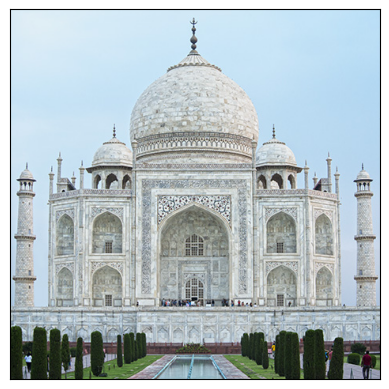

In [12]:
plt.imshow(image)
plt.xticks([])
plt.yticks([])
plt.show()

### Convolution examples

AHORA VAMOS A VER LOS DIFERENTES EFECTOS QUE TIENEN ALS CONVOLUCIONES QUE HEMOS VISTO EN LA PARTE TEÓRICA.
LA PRIMERA QUE VAMOS A PROBAR ES LA DE LA IDNETIDAD QUE COMO SU PROPIO NOMBRE INDICA, ES DEJAR LA IMAGEN IGUAL QUE ESTABA. ES COMO NO REALIZAR NADA

The following kernel performs the identity operation. The result of the convolution returns the original image.

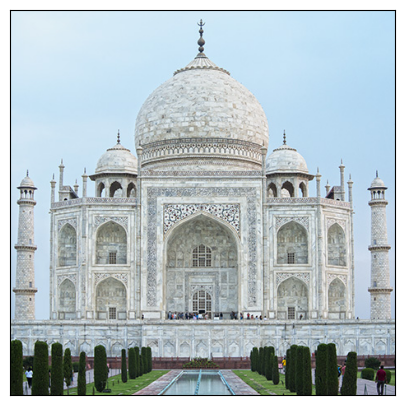

In [13]:
identity_kernel = np.array([
    [0, 0, 0],
    [0, 1, 0],
    [0, 0, 0]
])

img = cv2.filter2D(image, -1, identity_kernel) # EL FILTRADO LO HACEMOS CON OPENCV CON FILTER2D

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(img);

LUEGO ESTÁ EL FILTRO DE BLUR QUE LO QUE HACE ES UN PROMEDIO DE LOS PIXELES DE LA IMAGEN HACIENDO QUE SE DIFUMINEN LOS BORDES. ESTO LO QUE HACE EN ESTA IMAGEN POR EJEMMPLO ES HACER QUE NO SE VEAN TAN CLAROS LOS DETALLES D ELA PUERTA POR EJEMPLO.

The following filter applies the [Box Blur] (https://en.wikipedia.org/wiki/Box_blur), where each pixel of the resulting image has a value equal to the mean of its pixel values neighbors.

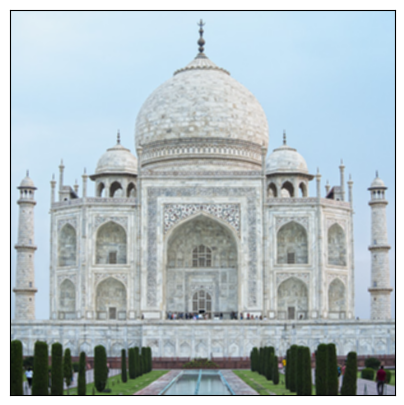

In [14]:
box_blur_filter = (1/9) * np.array([
    [1, 1, 1],
    [1, 1, 1],
    [1, 1, 1]
])

img = cv2.filter2D(image, -1, box_blur_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])
plt.imshow(img);

OTRO TIPO DE BLUR ES EL BLUR GAUSSIANO QUE NO ELIMINA TANTO LOS DETALLES Y PUEDE LLEGAR A MEJORAR LA IMAGEN. POR EJEMPLO SI AÑADIMOS RUIDO GAUSSIANO A LA IMAGEN PARA CORROMPER UN POCO CON UNA DESVIACION TIPICA DE 20 (CABE RECORDAR QUE LOS PIXELS ESTÁN ENTRE 0 Y 255) AÑADIMOS RUIDO.


The following example shows a filter widely used in digital image processing: the [Gaussian filtering] (https://en.wikipedia.org/wiki/Gaussian_blur).

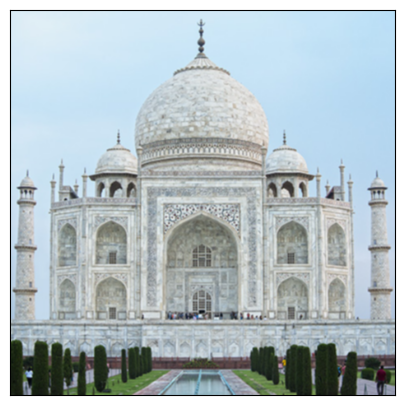

In [15]:
gaussian_blur_filter = (1/16) * np.array([
    [1, 2, 1],
    [2, 4, 2],
    [1, 2, 1]
])

img = cv2.filter2D(image, -1, gaussian_blur_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])

plt.imshow(img);

We can gaussian noise to the image and see the effects

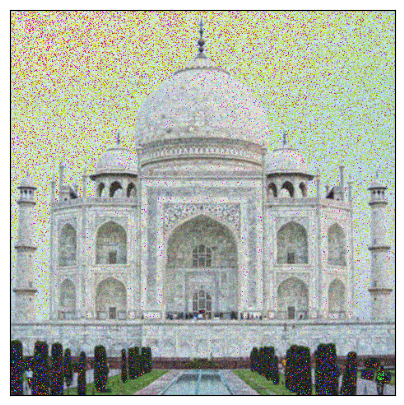

In [16]:
sigma = 20
n, m, k = image.shape
img_noise = img + sigma*np.random.randn(n, m, k)
fig, ax = plt.subplots(1, figsize=(5, 5))
ax.set_xticks([])
ax.set_yticks([])

plt.imshow(img_noise.astype(np.uint8));

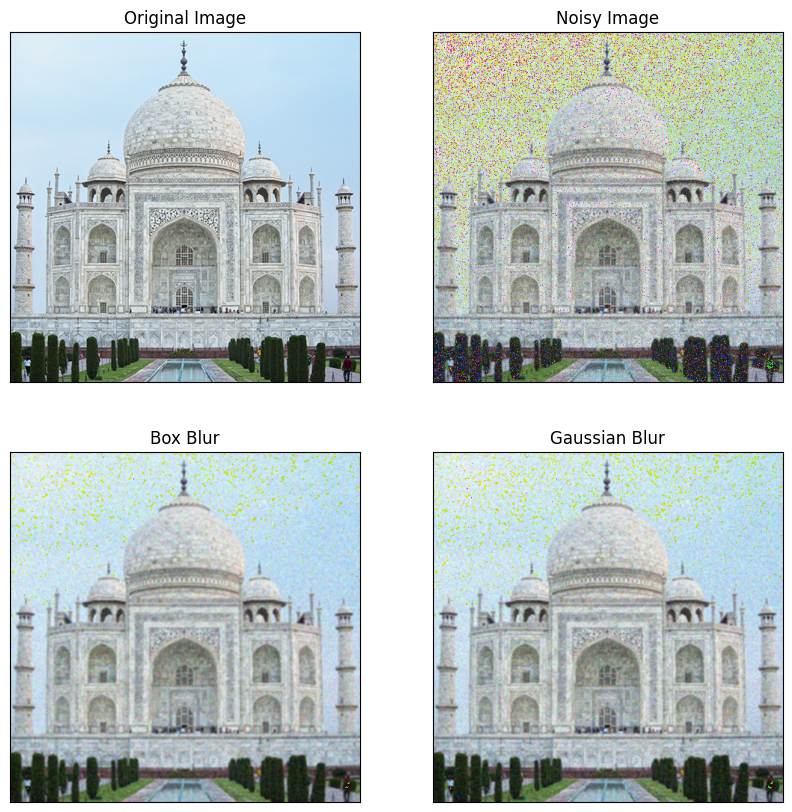

In [17]:
# AHORA HACEMOS EL FILTRO BOX Y EL GAUSSIANO
img1 = cv2.filter2D(img_noise, -1, gaussian_blur_filter)

fig, ax = plt.subplots(2, 2, figsize=(10, 10))

for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        ax[i,j].set_xticks([])
        ax[i,j].set_yticks([])

ax[0, 0].set_title('Original Image')
ax[0, 0].imshow(image.astype(np.uint8));

ax[0, 1].set_title('Noisy Image')
ax[0, 1].imshow(img_noise.astype(np.uint8));

ax[1, 0].set_title('Box Blur')
ax[1, 0].imshow(cv2.filter2D(img_noise, -1, box_blur_filter).astype(np.uint8));

ax[1, 1].set_title('Gaussian Blur')
ax[1, 1].imshow(cv2.filter2D(img_noise, -1, gaussian_blur_filter).astype(np.uint8));

# VEMOS QUE LA IMAGEN ORIGINAL SE HA CORRIMPIDO CON RUIDO (NOISY IMAGE) Y QUE APLICANDO A LA IMAGEN CON RUIDO LOS FILTROS TANTO DEL BOX PLOT COMO DEL GAUSSIANO SE ELIMINA PARTE DEL RUIDO
# ESE ES UN PRIMER TRATAMIENTO DEL RUIDO
# TAMBIEN PODRIAMOS HACER LO QUE VIMOS EN TEORIA DE LOS DETECTORES DE EJES TANTO VERTICALES COMO HORIZONTALES

The following filter is used for edge detection in images.

A CONTINAUCION HACEMOS FILTROS VERTICALES EN LOS CUALES VAMOS A DETECTAR LOS BORDES VERTICLAES

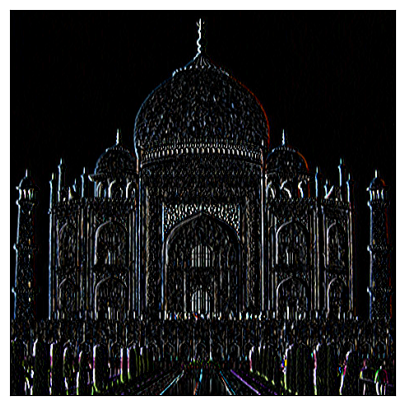

In [18]:
edge_detection_filter = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
])

img = cv2.filter2D(image, -1, edge_detection_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])

plt.imshow(img);

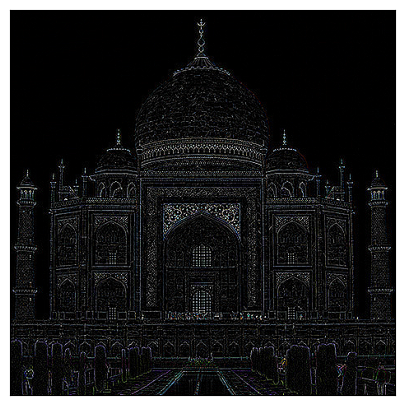

In [19]:
# AHORA DETECTAMOS LOS BORDEN EN LAS DIRECCIONES QUE INDICAMOS CON EL -4,1...

edge_detection_filter = np.array([
    [0, 1, 0],
    [1, -4, 1],
    [0, 1, 0]
])

img = cv2.filter2D(image, -1, edge_detection_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])

plt.imshow(img);

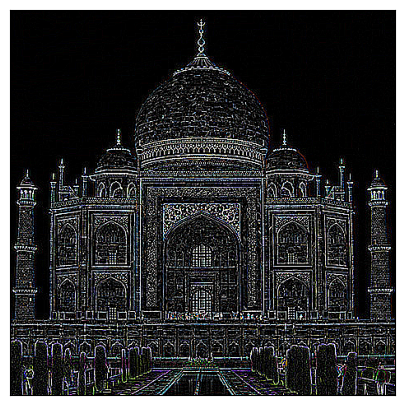

In [20]:
# AQUI PONEMOS EL FILTRO EN TODAS LAS DIRECCIONES (AQUI SE VEN TODO SLOS EJES/ TODOS LOS)

edge_detection_filter = np.array([
    [1, 1, 1],
    [1, -8, 1],
    [1, 1, 1]
])

img = cv2.filter2D(image, -1, edge_detection_filter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])

plt.imshow(img);

LUEGO EL FILTRO DE SHARPEN CONSISTE EN RESTARLE LOS EJES/BORDES A LA IMAGEN ORIGINAL. LO QUE HACE ES REALZAR EL INTERIOR DE LA IMAGEN QUE ESTÁ DENTRO DE LOS BORDES.

The following filter allows you to highlight the edges of the image by increasing its contrast. The filter is the result of subtracting the matrix of an edge detection filter from the matrix of an identity filter:

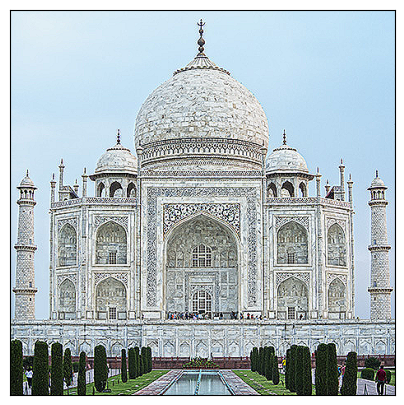

In [21]:
sharpen_flter = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

img = cv2.filter2D(image, -1, sharpen_flter)

fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])
plt.imshow(img);

OPENCV TIENE MUCHOS FILTROS Y PODEMOS VERLOS EN ESTE ENLACE Y JUGAR CON ELLOS

OpenCV provides a multitude of techniques for digital image processing. Other examples of filters that we can apply to images are, for example, those that allow us to perform [morphological transformations](https://docs.opencv.org/4.x/d9/d61/tutorial_py_morphological_ops.html).

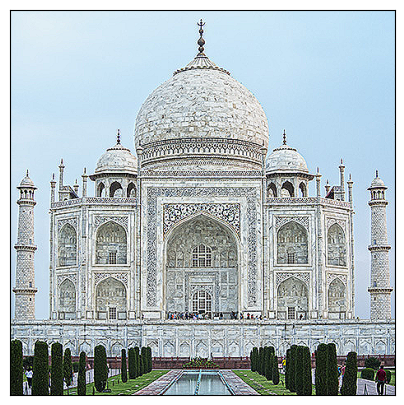

In [22]:
kernel = np.ones((1, 1), np.uint8)
dilation = cv2.dilate(img, kernel, iterations=1)


fig, ax = plt.subplots(1, figsize=(5, 5))
plt.xticks([])
plt.yticks([])
plt.imshow(dilation)

<a id='image_classification_cnn'></a>
# Image Classification CNN

A CONTINUACIÓN VAMOS A VER COMO SE CREAN LAS REDES CONVOLUCIONALES EN TENSOR FLOW Y EN KERAS. PARA ELLO VAMOS A USAR UN DATASET DE 3700 FOTOGRAFIAS DE FLORES DE 5 TIPOS DIFERENTES
VAMOS A TRATAR DE CREAR UN CLASIFICADOR PARA LOS 5 TIPOS DE FLORES QUE HAY

In this section we will study the problem of classifying images with convolutional neural networks (CNN). To do this, we will rely on the [TensorFlow tutorial](https://www.tensorflow.org/tutorials/images/classification).

We will start with the download of the dataset. We will work with a set of **~ 3700 photographs** of flowers from **5 different classes**.

In [23]:
import pathlib
import os
import tensorflow as tf
dataset_url = 'https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz'
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

# Check the directory structure
contents = os.listdir(data_dir)
if 'flower_photos' in contents and len(contents) == 1:
    # We're in Colab - need to go one level deeper
    data_dir = os.path.join(data_dir, 'flower_photos')
    data_dir = pathlib.Path(data_dir)

# At this point, data_dir should directly contain the flower categories
print(os.listdir(data_dir))  # Should now show 'roses', 'daisy', etc. in both environments
# VEMOS QUE SE HAN CREADO CARPETAS CON LOS NOMBRES DEL TIPO DE FLOR Y DENTRO DE CADA CARPETA ESTÁN LAS IMAGENES.

['dandelion', 'tulips', 'LICENSE.txt', 'sunflowers', 'daisy', 'roses']


We check that we have all the photographs.

In [2]:
image_count = len(list(data_dir.glob('*/*.jpg')))
print(image_count)
# PODEMOS VER EL NÚMERO DE IMAGENES QUE TENEMOS

3670


Visualize some of them

In [24]:
# POR EJEMPLO COGEMOS UNA ROSA DE MANERA ALEATORIA Y HACEMOS UN PLOT Y HACEMOS LO MISMO CON UN GIRASOL
roses = list(data_dir.glob('roses/*'))
sunflowers = list(data_dir.glob('sunflowers/*'))

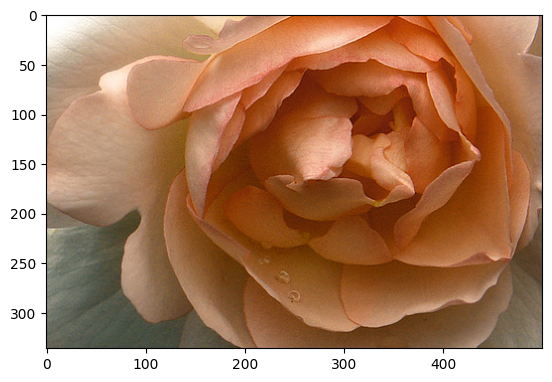

In [25]:
im = read_image(str(roses[np.random.randint(0, len(roses))]))
plt.imshow(im);

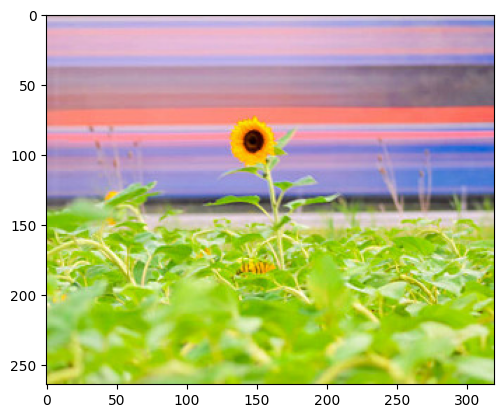

In [26]:
im = read_image(str(sunflowers[np.random.randint(0, len(sunflowers))]))
plt.imshow(im);

VAMOS A TRATAR DE CREAR UN CLASIFICADOR PARA LOS 5 TIPOS DE FLORES QUE HAY. PARA ELLO VAMOS A USAR UNA FUNCION DE KERAS QUE LO QUE HARÁ ES CREAR UN DATASET DESDE EL DIRECTORIO Y VA A IR RECORRIENDO LAS CARPETAS CON LOS NOMBRES DE TIPOS DE FLORES Y LO VA A IR GUARDANDO EN LOS BATCHES QUE NOSOTROS LE DIGAMOS.
HACEMOS UNO PARA TRAIN Y OTRO PARA TEST. LE PONDREMOS UN TAMAÑO DE 96*96

We create a TensorFlow dataset with the data that we have previously loaded to disk with the [`image_dataset_from_directory ()`](https://keras.io/api/preprocessing/image/#image_dataset_from_directory-function)
method.

The `colos_mode` parameter (by default 'rgb') allows you to choose the color scale to use. To automatically load and convert the images to grayscale it must be set as `color_mode = grayscale`.

In [27]:
image_size = (96,96)
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,  # 80%  train, 20% validation
  subset='training',  # 'training' o 'validation', only  with 'validation_split'
  seed=1,
  image_size=image_size,  # Dimension (img_height, img_width) for rescaling
  batch_size=64
)

Found 3670 files belonging to 5 classes.
Using 2936 files for training.


In [28]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset='validation',
  seed=1,
  image_size=image_size,
  batch_size=64)


Found 3670 files belonging to 5 classes.
Using 734 files for validation.


In [29]:
class_names_list = train_ds.class_names
class_names_list
# TRAS CREARLOS VEMOS LOS TIPOS DE CLASES QUE HAY

['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']

### Configure the dataset for performance

Let's make sure to use buffered prefetching so you can yield data from disk without having I/O become blocking. These are two important methods you should use when loading data.

`Dataset.cache()` keeps the images in memory after they're loaded off disk during the first epoch. This will ensure the dataset does not become a bottleneck while training your model. If your dataset is too large to fit into memory, you can also use this method to create a performant on-disk cache.

`Dataset.prefetch()` overlaps data preprocessing and model execution while training.

Interested readers can learn more about both methods, as well as how to cache data to disk in the [data performance guide](https://www.tensorflow.org/guide/data_performance#prefetching).

PODRIAMOS EJECUTAR O NO LA SIGUIENTE IMAGEN PERO HABRA DIFERENCIA EN LA VELOCIDAD. NOSOTROS VAMOS A QUERER IR GUARDANDO LAS IMAGENES EN LA MEMORIA RAM PARA NO TENER QUE ESTAR GUARDANDOLAS CONSTANTEMENTE Y ASI NO PERDER TIEMPO.

In [30]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

Visualizing some training samples.

VEMOS ALGUNOS EJEMPLOS DEL DATASET QUE SON BATCHES DE IMAGENES QUE ESTÁN MAL BARAJADAS:

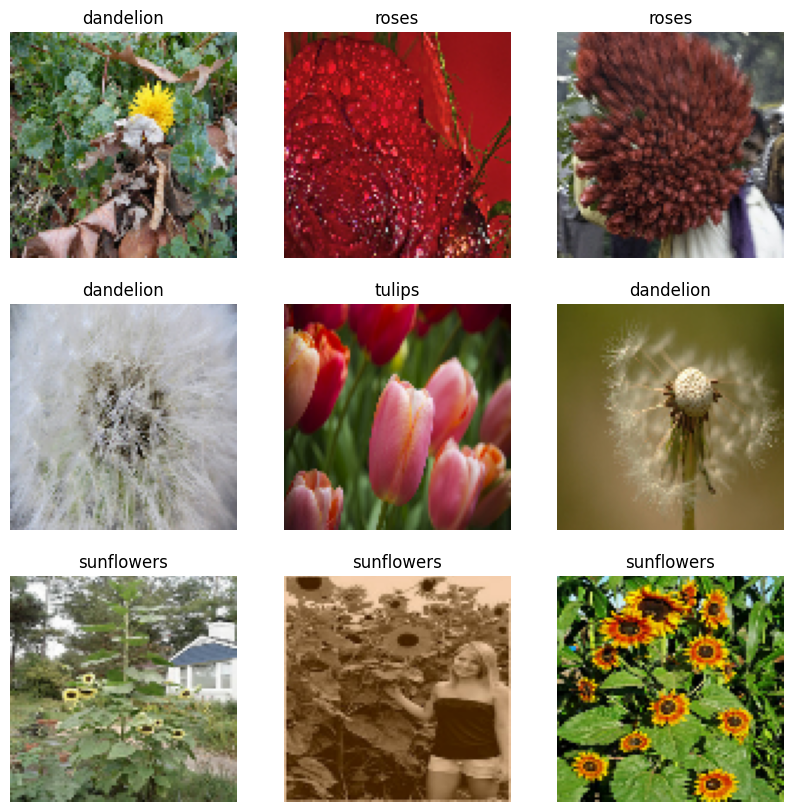

In [31]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names_list[labels[i]])
        plt.axis("off")

VEMOS QUE SON IMAGENES DE (64, 96, 96, 3): 64 BATCHES, TAMAÑO 66*96 Y 3 PORQUE ES UN RGB

We build the model. The **input will have a dimension of (n, n, 3)**, corresponding to (image height, image width, number of color channels).

At the input of the network we include a preprocessing that will allow the images to be rescaled by normalizing the pixel values to a range between 0 and 1.

In [32]:
for image_batch, labels_batch in train_ds:
    print(image_batch.shape)
    print(labels_batch.shape)
    break

(64, 96, 96, 3)
(64,)


In [35]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# CARGAMOS LAS LIBRERÍAS Y VAMOS A HACER LA PRIMERA RED CONVOLUCIONAL

## CNN model in Keras

LAS REDES CONVOLUCIONALES PUEDEN ESTAR FORMADAS POR LA PARTE CONVOLUCIONAL Y LUEGO POR LA PARTE DEL CLASIFICADOR DE LA RED DENSA.
LA PARTE CONVOLUCIONAL PUEDE TENER CAPAS CONVOLUCIONALES, CAPAS DE PULLING Y EL FLATTENING QUE ES CONVERTIR LAS IMAGENES EN VECTORES PARA LUEGO ENTRENAR UNA RED FULLY CONNECTED


<img src="https://i.ibb.co/D8CmT6K/cnn.jpg" alt="cnn" border="0">



A Convolutional Neural Network (CNN) architecture has four main parts:

- A **convolutional layer** that extracts features from a source image.

- A **pooling layer** that reduces the image dimensionality without losing important features or patterns.

- A **flattening layer** that transforms a n-dimensional tensor into a vector that can be fed into a fully connected neural network.

- A **fully connected layer** also known as the dense layer.

### Rescaling
PARA EMPEZAR VAMOS A QUERER TRASFORMAR LAS IMAGENES A RANGO 0-1. PARA ELLO VAMOS A USAR LAYERS REPROCESSING Y REScaling layers.experimental.processing.Rescaling(1./255). ESTO DIVIDE LAS IMAGENES DE ENTRADA ENTRE 255 PARA QUE VALGAN ENTRE 0 Y 1.
ESTO EN EL METODO FUNCINAL SE HACE COMO UNA CAPA MÁS

For converting the images to   \[0,1\] range.
```python
normalization_layer = layers.experimental.processing.Rescaling(1./255)
next_layer = normalization_layer(prev_layer)
```
or simply
```python
reescaling = layers.experimental.processing.Rescaling(1. / 255)(inputs)
```

### Convolutional layer

LAS CAPAS CONVOLUCIONALES CONSTAN DE VARIOS PARÁMETROS. ES IGUAL QUE LA DENSA PERO CON UNA CONVOLUCIONAL

In the convolutional layers (`Conv2D`) we will configure the following parameters:

- **filters**: number of feature maps. NUMERO DE FILTROS
- **kernel_size**: can be either an integer or a tuple of two integers. Specifies the height and width of the kernel. ES EL TAMAÑO DEL KERNEL
- **strides**:
- **padding**: allows you to include padding in the input data. With 'valid' it is not applied, with 'same' it is configured so that the dimension at the output of the convolution is the same as at the input. PUEDE SER SAME O VALID. SERÁ SAME SI QUEREMOS MANTENER EL MISMO VALOR Y VALID SI QUEREMOS QUE DISMINUYA SEGÚN LA FORMULA QUE HEMOS VISTO EN TEORÍA
- **activation**: activation function implemented. Recommended ReLU.

[Link to documentation](https://keras.io/api/layers/convolution_layers/convolution2d/)

```python
tf.keras.layers.Conv2D(
    filters, kernel_size, strides=(1, 1), padding='valid',
    activation=None, kernel_regularizer=None)

```
A ESTO SE LE PUEDE LLAMAR DE LA MANERA FUNCIONAL COMO UNA CAPA MÁS (AL IGUAL QUE PASA CON LAS DENSAS) O AÑADIENDOLA SI ESTAMOS EN LA API FUNCIONAL

With Functional API:
```python
next_layer = layers.Conv2D(filters=8, kernel_size=3, activation='relu', name='conv_1')(prev_layer)
```

With Sequential:
```python
model.add(layers.Conv2D(filters=8,kernel_size=3, activation='relu', name='conv_1'))
```

### Pooling layer

EN CUANTO AL POOLING TENEMOS 2 TIPOS: AVERAGE PULLING Y MAX PULLLING. ES EXACTAMENTE IGUAL Y UNICMANETE HAY QUE DEFINIR EL TAMAÑO DEL POOL (VENTANA) DE LA CUAL QUEREMOS COGER EL MÁXIMO O EL PROMEDIO.

A pooling layer is a new layer added after the convolutional layer. Specifically, after a nonlinearity ( ReLU) you can choose between [average pooling](https://www.tensorflow.org/api_docs/python/tf/keras/layers/AveragePooling2D) or [max pooling](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D). Usually max pooling is the best choice.


With Functional API:
```python
conv_1 = layers.Conv2D(filters=8, kernel_size=3, activation='relu', name='conv_1')(prev_layer)

pool_1 = layers.MaxPool2D(pool_size=(2, 2), name='pool_1')(conv_1)
```

With Sequential:
```python
model.add(layers.AveragePooling2D(pool_size=(2, 2), name='pool_1'))
```

### Flattening

SE USA PARA PONER UN VECTOR PARA PODER ALIMNETAR LA RED FULLY CONNECTED

Prepares a vector for the fully connected layers.

With Functional API:

```python
next_layer = layers.Flatten(name='flatten')(prev_layer)
```

With Sequential:
```python
model.add(layers.Flatten(name='flatten'))
```

There is another alternative for flattening that is a type of pooling that is called global pooling. Global pooling down-samples the entire feature map to a single value.

You can also choose between [GlobalAveragePooling2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/GlobalAveragePooling2D) and [GlobalMaxPooling2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/GlobalMaxPool2D).

```python
model.add(layers.GlobalMaxPool2D(name='GlobalMaxPooling2D'))
```

### Fully-connected layer

POR ULTIMO SE TIENE LA CAPA FULLY CONNECTED

Dense layer like a simple neural network

In [36]:
# COMO EJEMPLO VAMOS A VER UNA RED CONVOLUCIONAL DE SOLO DOS CAPAS: 1 CONVOLUCIÓN Y UN PULLING, 1 CONVOLUCIÓN Y UN PULLING

inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.Rescaling(1. / 255)(inputs)

# Conv Layer 1:
# conv_1: VAMOS A TENER 4 FILTROS CON TAMAÑO DE VENTANA 3. LA VENTANA QUE VA A RECORRER LA CONVOLUCIÓN ES DE 3X3
conv_1 = layers.Conv2D(4, 3, padding='valid', activation='relu',
                       name='conv_1')(reescaling)
# pool_1: EL POOLING VA A SER DE 2X2
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(4, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)


# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense) # CABE RECORDAR QUE TENEMOS 5 TIPOS DE FLORES DIFERENTES POR LO QUE NUESTRA ULTIMA CAPA PUEDE TENER 5 NEURONAS Y SU ACTIVACIÓN VA A SER SOFTMAX

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

# AL CREARLO VEMOS QUE TIENE MUY POCOS PARÁMETROS HASTA LA PARTE DE FULLLY CONNECTED QUE ES CUANDO AUMENTA MMUCHO EL NÚMERO DE PARÁMETROS DE NUESTRAS REDES

In [37]:
model.summary()

Model: "cnn_example"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_1 (Conv2D)                 │ (None, 94, 94, 4)      │           112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_1 (MaxPooling2D)           │ (None, 47, 47, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_2 (Conv2D)                 │ (None, 45, 45, 4)      │           148 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ pool_2 (MaxPooling2D)           │ (None, 22, 22, 4)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1936)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       123,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output (Dense)                  │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 124,553 (486.54 KB)

 Trainable params: 124,553 (486.54 KB)

 Non-trainable params: 0 (0.00 B)

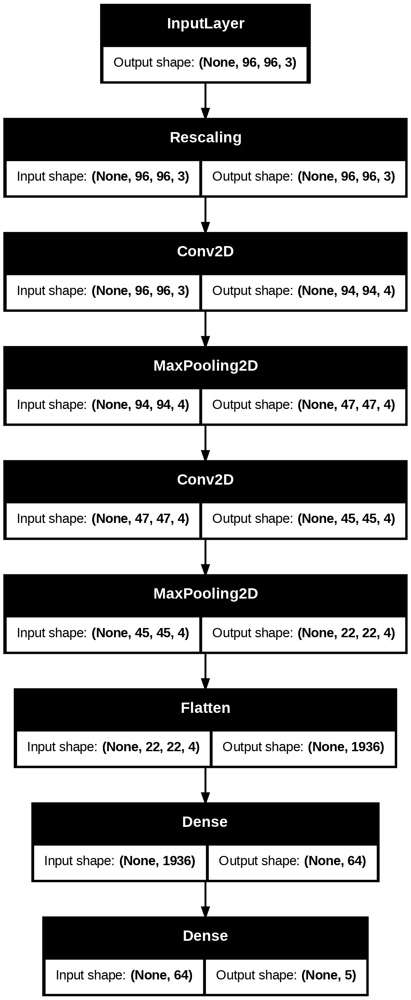

In [38]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True)

# SI DIBUJAMOS ELL MODELO VAMOS VIENDO SUS CAPAS.


Compile the model

In [39]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

Training the model

In [40]:
epochs = 8
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)

Epoch 1/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 10s 92ms/step - accuracy: 0.2381 - loss: 1.6026 - val_accuracy: 0.3134 - val_loss: 1.4818
Epoch 2/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.3489 - loss: 1.4513 - val_accuracy: 0.4087 - val_loss: 1.3882
Epoch 3/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.4477 - loss: 1.3274 - val_accuracy: 0.3978 - val_loss: 1.3799
Epoch 4/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4855 - loss: 1.2421 - val_accuracy: 0.5000 - val_loss: 1.2635
Epoch 5/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5253 - loss: 1.1850 - val_accuracy: 0.5068 - val_loss: 1.2231
Epoch 6/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.5640 - loss: 1.1058 - val_accuracy: 0.5395 - val_loss: 1.1590
Epoch 7/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.6002 - loss: 1.0117 - val_accuracy: 0.5708 - val_loss: 1.1291
Epoch 8/8
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6454 - loss: 0.9411 - val_accuracy: 0.5354 - val_loss: 1.165

TRAS COMPILAR Y ENTRENAR VISULIZAMOS LOS RESULTADOS

Visualize the results

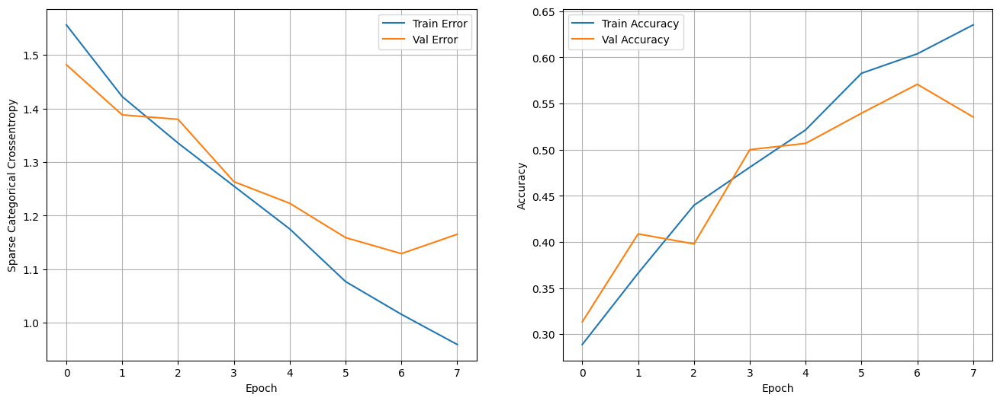

In [41]:
# VEMOS QUE HA LLEGADO A UN ACCURACY DE APROXIMADAMENTE 0.6 QUE NO ESTA MAL PERO LUEGO PODRMEOS VER QUE AÑADIENDO MÁS CAPAS O FILTROS O MIRANDO EL TAMAÑO DEL KERNEL PODRÁ SUBIR
# UNA VEZ QUE LO TENGAMOS ENTRENADO USAREMOS ESTAS GRAFICAS PARA VER COMO HA IDO EVOLUCIONANDO EL ACCURACY
import pandas as pd
def show_loss_accuracy_evolution(history):

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Sparse Categorical Crossentropy')
    ax1.plot(hist['epoch'], hist['loss'], label='Train Error')
    ax1.plot(hist['epoch'], hist['val_loss'], label = 'Val Error')
    ax1.grid()
    ax1.legend()

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.plot(hist['epoch'], hist['accuracy'], label='Train Accuracy')
    ax2.plot(hist['epoch'], hist['val_accuracy'], label = 'Val Accuracy')
    ax2.grid()
    ax2.legend()

    plt.show()

show_loss_accuracy_evolution(history)

#

Plot bad predictions

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step 


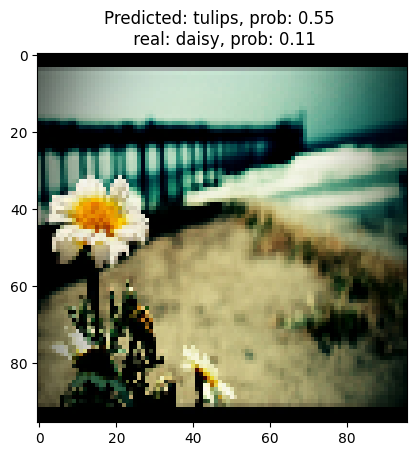

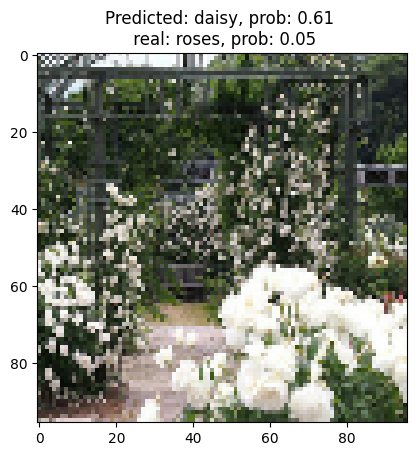

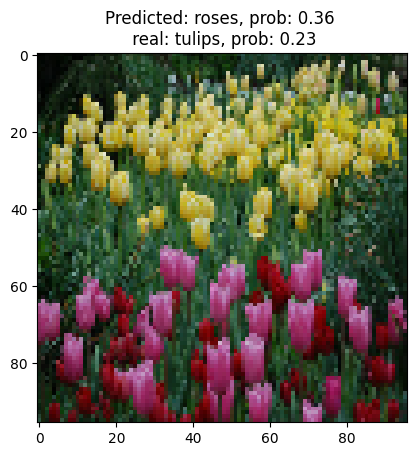

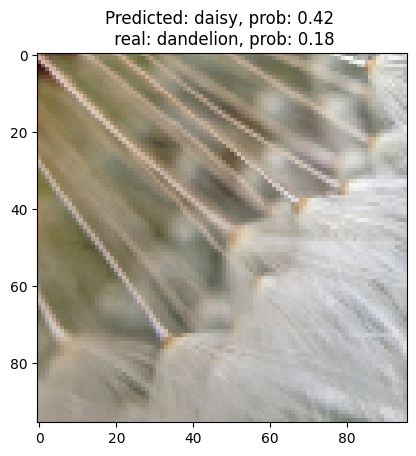

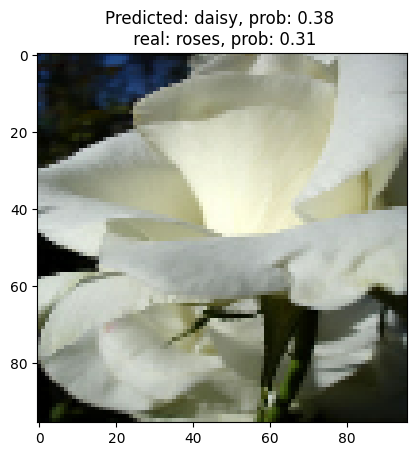

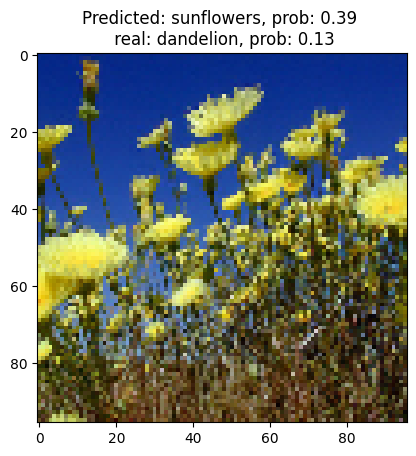

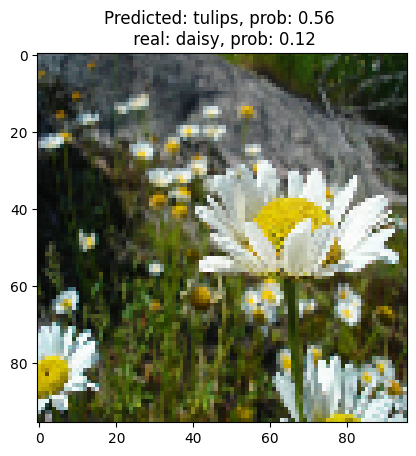

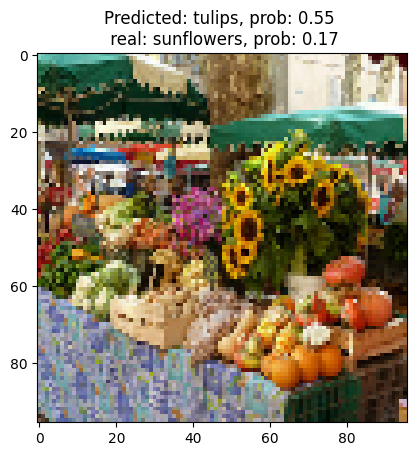

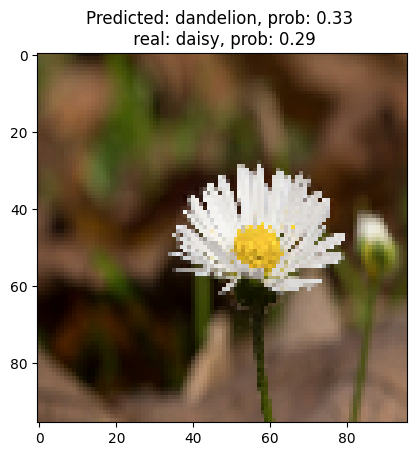

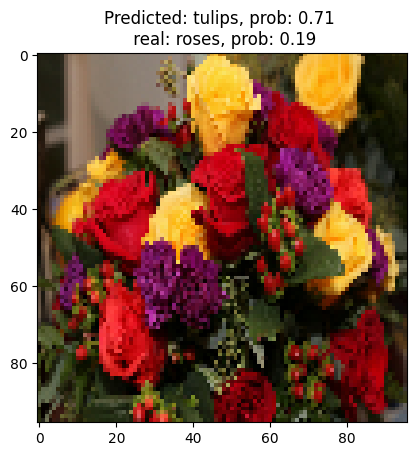

In [42]:
# CON LA FUNCION SHOW_ERRORS VEMOS EN QUE TIPO DE IMAGENES FALLA Y VEMOS SI ES LOGICO QUE HAYA FALLADO O NO

def show_errors(val_ds, model, class_names_list, n_images=10):
    n_plots = 0
    for images, labels in val_ds:
        pred_probs = model.predict(images)
        preds = pred_probs.argmax(axis=-1)
        bad_pred_inds = np.where(preds != labels)[0]
        for ind in list(bad_pred_inds):
            n_plots += 1
            real_class = class_names_list[labels[ind].numpy()]
            pred_class = class_names_list[preds[ind]]
            prob = pred_probs[ind].max()
            prob_real = pred_probs[ind][[
                i for i, c in enumerate(class_names_list) if c == real_class
            ][0]]
            plt.imshow(images[ind].numpy().astype("uint8"))
            plt.title(
                'Predicted: {0}, prob: {1:.2f} \n real: {2}, prob: {3:.2f}'
                .format(pred_class, prob, real_class, prob_real))
            plt.show()

            if n_plots == n_images:
                return
    return


show_errors(val_ds, model, class_names_list, n_images=10)

# AQUI VEMOS ALGUNOS ERRORES

EN LOS EJERCICIOS PROPUESTOS PODEMOS VARIAR EL TAMAÑO DEL POLL,  EL NÚMERO DE FILTROS, SE PUEDE AÑADIR UNA CAPA MÁS HASTA LLEGAR A TENER UN ACCURACY SUPERIOR.
EL OBJETIVO ES LLEGAR A UN ACCURACY DE 0.72 LO CUAL ES POSIBLE LOGRAR CON ESTAS 2 CAPAS O PODRÍAMOS AÑADIR UNA CAPA MÁS.

#### Question 1: What happen with the validation loss and with the number of parameters if you increment the number of filters and the kernel_size ?

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.Rescaling(1. / 255)(inputs)

# Conv Layer 1
# PODEMOS PROBAR A PONER MAS FILTROS COMO 16,32,64... EL TAMAÑO DEL KERNEL PODEMOS VARIARLO ENTRE 2,3,4 COMO MUCHO 5.
conv_1 = layers.Conv2D(filters=16, kernel_size=..., padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1) # PODEMOS ESTUDIAR LA DIFERENCIA ENTRE PONER MaxPooling2D O AveragePooling

# Conv Layer 2
conv_2 = layers.Conv2D(..., ..., padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)


# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

print(model.summary())

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)
show_loss_accuracy_evolution(history)

#### Question 2: What happen with the validation loss and with the number of parameters if you vary  the `pool_size` and the padding of the filters to `same` ?

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.Rescaling(1. / 255)(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(filters=..., kernel_size=..., padding=..., activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(..., ...), name='pool_1')(conv_1)

# Conv Layer 2
conv_2 = layers.Conv2D(4, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_2')(conv_2)

# Fully-connected
# Flattening
flat = layers.Flatten(name='flatten')(pool_2)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

print(model.summary())

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 10
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
)
show_loss_accuracy_evolution(history)

#### Question 3: Create a model with `val_accuracy > 0.72`

You can use early-stopping callback and dropouts techniques.

```python
next_layer = layers.Dropout(0.4)(prev_layer)
```

```python
next_layer = layers.BatchNormalization()(prev_layer)
```

```python
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=5,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)
```

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
reescaling = layers.Rescaling(1. / 255)(inputs)
...
outputs = layers.Dense(5, activation='softmax', name='output')(dense)
model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')


In [ ]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

In [ ]:
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=4,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)


epochs = 25
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)

show_loss_accuracy_evolution(history)

In [ ]:
show_errors(val_ds, model, class_names_list, n_images=10)

### Data Augmentation

SE PUEDE CREAR NUEVAS IMAGENES A PARTIR DE LAS IMAGENES DE MANERA ALEATORIA SIMPLEMENTE CON CAPAS DEL EXPERIMIENTO

[**data augmentation**](https://en.wikipedia.org/wiki/Data_augmentation) We transform randomly the training images.

Data augmentation can be done before starting any training directly on the available image set, or working with the [Keras layers for that purpose](https://www.tensorflow.org/tutorials/images/data_augmentation). In that example we will do it the second way by randomly rotating, flipping and scaling the images.

PODEMOS IR A LOS TUTORIALES A VER LOS TIPOS DE TRANSFORMACIONES QUE SE PUEDEN USAR.

In [44]:
data_augmentation = keras.Sequential(
  [
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.25),
    layers.RandomZoom(0.25),
    layers.RandomContrast(0.1),
    layers.RandomBrightness(factor=0.2)
  ]
)

# VAMOS A VER QUE SUCEDE CUANDO SE APLICAN ESTAS CAPAS SOBRE UNA IMAGEN.

Some examples

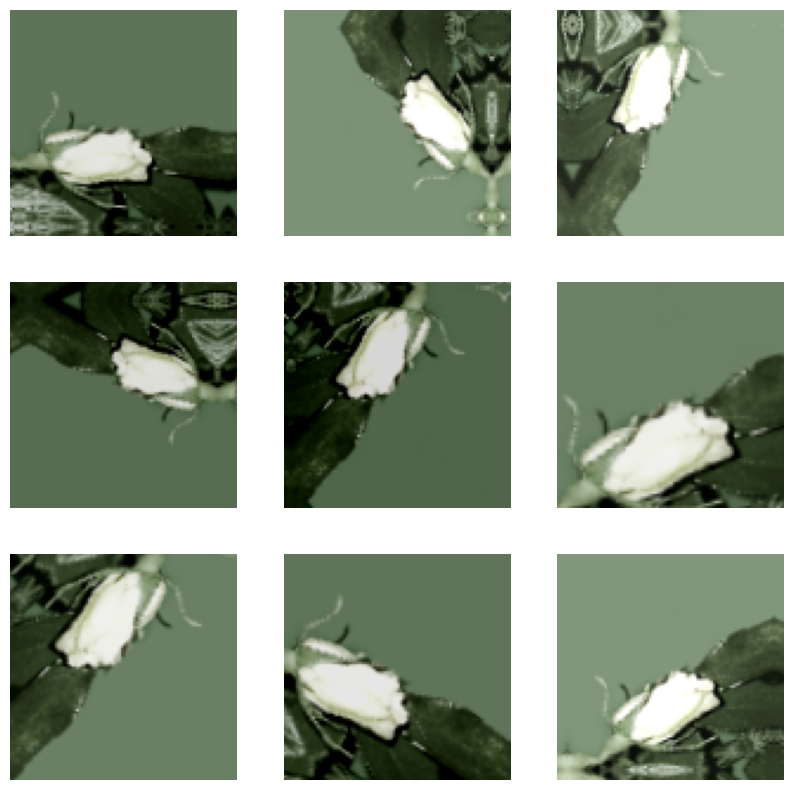

In [45]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
    for i in range(9):
        augmented_images = data_augmentation(images, training=True)
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[0].numpy().astype("uint8"))
        plt.axis("off")

# VEMOS QUE A PARTIR DE UNA PRIMERA IMAGEN DE FLOR LA DOBLA, LA HACE ZOOM, LA GIRA... ESTO VEREMOS SI MEJORA NUESTRO MODELO

We include the stage that performs the transformations in the images at the beginning of the model that we built previously, we repeat the training and visualize the results.

In [46]:
# DECLARAMOS EL DATA AUMENTATION COMO LO HABIAMOS DECLARADO ARRIBA Y LO HACEMOS COMO SI FUERA UNA CAPA MÁS.
# LO VAMOS LLAMANDO A LAS ENTRADAS PARA IR TRASFORMANDO LAS IMAGENES Y LE APLICMAOS EL MISMO MODELO.

inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
data_aug = data_augmentation(inputs)
reescaling = layers.Rescaling(1. / 255)(data_aug)

# Conv Layer 1
conv_1 = layers.Conv2D(8, 3, padding='valid', activation='relu',
                       name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(2, 2), name='pool_1')(conv_1) # PODRIAMOS METERLE POR EJEMPLO UN DROPOUT

# Conv Layer 2
conv_2 = layers.Conv2D(8, 3, padding='valid', activation='relu',
                       name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(name='pool_2')(conv_2)

# Conv Layer 3
conv_3 = layers.Conv2D(8,
                       3,
                       padding='valid',
                       activation='relu',
                       name='conv_3')(pool_2)
pool_3 = layers.MaxPooling2D(name='pool_3')(conv_3)

# Fully-connected
flat = layers.Flatten(name='flatten')(pool_3)
dense = layers.Dense(64, activation='relu', name='dense')(flat)
outputs = layers.Dense(5, activation='softmax', name='output')(dense)

model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_example')

Epoch 1/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.2525 - loss: 1.5744 - val_accuracy: 0.4864 - val_loss: 1.2419
Epoch 2/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.4473 - loss: 1.2712 - val_accuracy: 0.5109 - val_loss: 1.1462
Epoch 3/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.4753 - loss: 1.2458 - val_accuracy: 0.4959 - val_loss: 1.1614
Epoch 4/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.5200 - loss: 1.1547 - val_accuracy: 0.4918 - val_loss: 1.2621
Epoch 5/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - accuracy: 0.5285 - loss: 1.1264 - val_accuracy: 0.5463 - val_loss: 1.0730
Epoch 6/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.5679 - loss: 1.0575 - val_accuracy: 0.5422 - val_loss: 1.0990
Epoch 7/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5797 - loss: 1.0435 - val_accuracy: 0.5082 - val_loss: 1.2602
Epoch 8/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - accuracy: 0.5823 - loss: 1.0378 - val_accuracy: 0.5599 - val_l

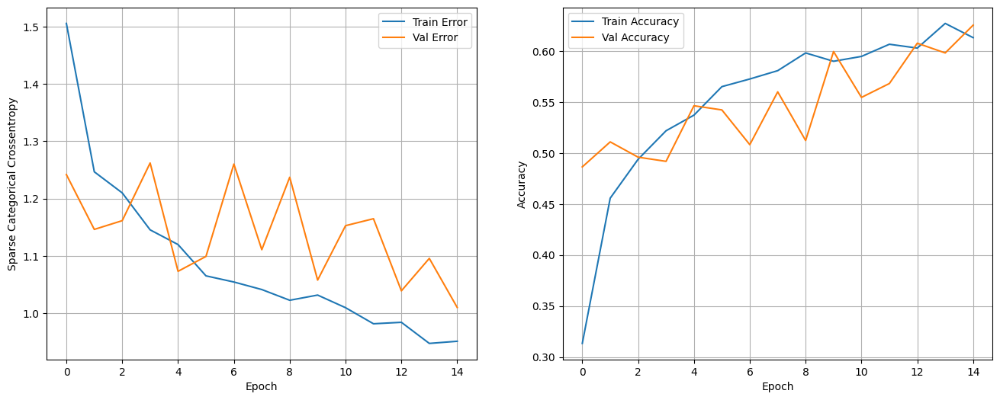

In [47]:
# UNA VEZ CREADO EL MODELO, CON UN CALLBACK DE EARLYSTOPPING CON UNA PACIENCIA DE 5 POR EJEMPLO Y VEMOS SI MEJORAN LOS RESULTADOS

es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=5,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)

model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 15
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)
show_loss_accuracy_evolution(history)

VEMOS QUE AUN PODRIA HABER BAJADO MÁS. POR LO QUE SE SUGIERE USAR EL MODELO ANTERIOR QUE MEJORES RESULTADOS HA DADO Y AÑADIRLE LA CAPA DE AUMENTATION PARA ESTUDIAR EL IMPACTO QUE HA TENIDO (SI HA MEJORADO O NO HA MERECIDO LA PENA)

#### Question 4: Use the best model you have found and include the `data_aug` layer, compare the results

In [ ]:
inputs = tf.keras.Input(shape=image_size + (3, ), name='input')
data_aug = data_augmentation(inputs)
reescaling = layers.Rescaling(1. / 255)(data_aug)
...

In [ ]:
es_callback = keras.callbacks.EarlyStopping(
    monitor='val_loss',  # can be 'val_accuracy'
    patience=10,  # if during 5 epochs there is no improvement in `val_loss`, the execution will stop
    verbose=1)
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)

epochs = 50
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=[es_callback]
)
show_loss_accuracy_evolution(history)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step 


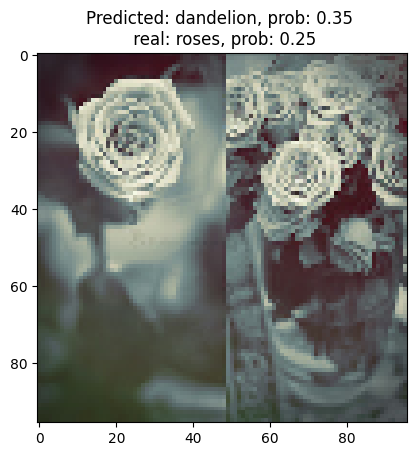

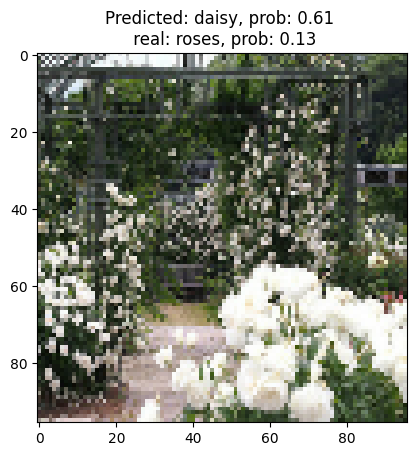

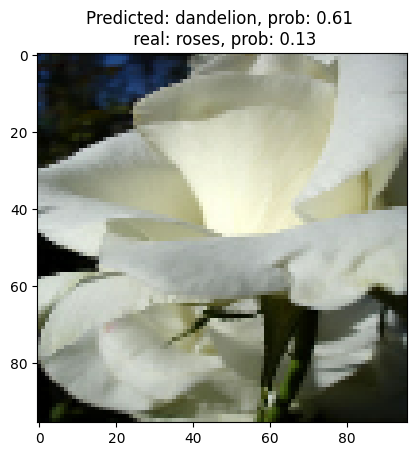

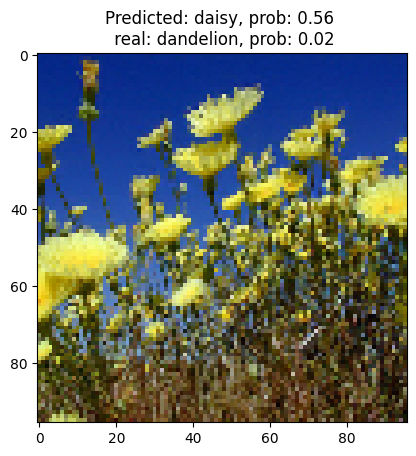

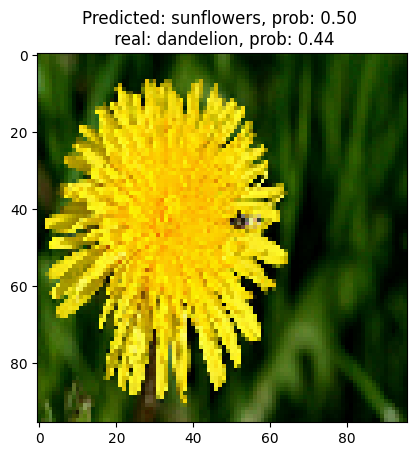

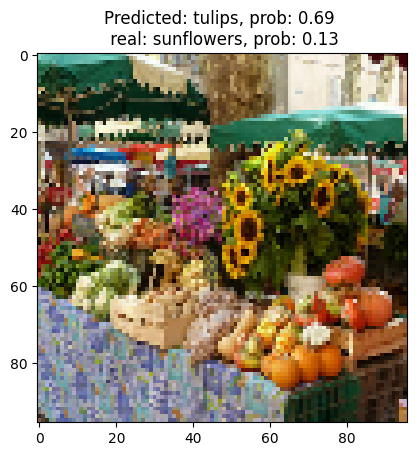

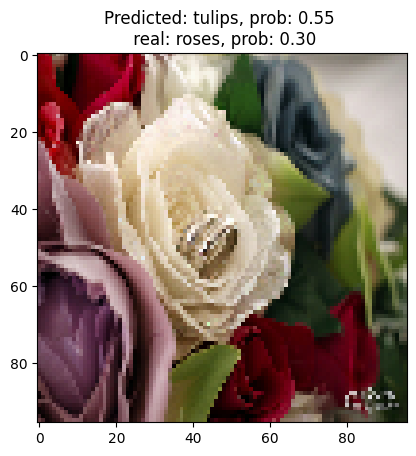

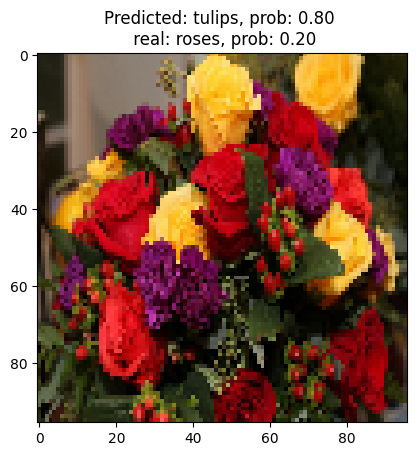

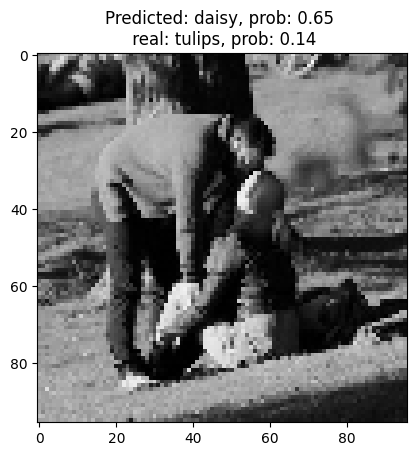

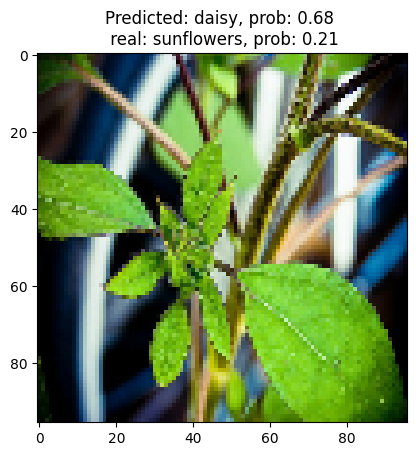

In [48]:
show_errors(val_ds, model, class_names_list, n_images=10)

## Transfer learning

POR ULTIMO VAMOS A VER UN PUNTO MUY IMPORTANTE QUE VIMOS EN TEORÍA. AQUI SE VA A INTENTAR USAR UN MODELO QUE SEA TOP. POR EJEMPLO UN EQUIPO DE INVESTIGACIÓN HACE SU PUBLICO. CON KERAS VAMOS A PODER USAR ESE COMODELO CON TAN SOLO UNA LINEA. KERAS Y TENSOR FLOW HACEN QUE TODO SEA MUY SENCILLO.
ENTONCES LO QUE HAY QUE HACER ES COGER UN MODELO PRE-ENTRENADO, QUITARLE LA ULTIMA CAPA, DEJARLE LOS PESOS CONGELADOS Y ENTRENAR UN MODELO ENCIMA.
VAMOS A USAR EL MOBILENET PERO PODMEOS USAR UN MONTON. SI NOS METEMOS EN KERAS.APPLICATIONS TENEMOS UN LISATDO DE TODOS LOS MODELOS QUE PODEMOS USAR.
MOBILENET ES UNO LIGERO QUE TIENE POCO TAMAÑO. ES RÁPIDO Y TIENE BUEN ACCURACY. ES UN MODELO BASTANTE POTENTE CON 88 CAPAS.
VAMOS A USARLO COMO MODELO PREVIO PARA HACER EL TRANSFER



With transfer learning, you benefit from both advanced convolutional neural network architectures developed by top researchers and from pre-training on a huge dataset of images. In our case we will be transfer learning from a network trained on ImageNet, a database of images containing many plants and outdoors scenes, which is close enough to flowers.

<img src="https://i.ibb.co/KsLSGyt/transfer-learning.png" alt="transfer-learning" border="0">

[MobileNetV2](https://arxiv.org/abs/1801.04381) is a significant improvement over MobileNetV1 and pushes the state of the art for mobile visual recognition including classification, object detection and semantic segmentation.

In [`tf.keras.applications`](https://www.tensorflow.org/api_docs/python/tf/keras/applications) you have many pre-trained models. You can compare them [here](https://keras.io/api/applications/#available-models).

With the parameter `include_top=False`, you can delete the last `softmax` layer.

With `pretrained_model.trainable = False`, you freeze the pre-trained model weights.

In [49]:
# ESTO CON KERAS SE HACE LLAMANDOLO CON EL TAMAÑO DE LA IMAGEN.
# LE HEMOS PUESTO QUE NO INCLUYA LA CAPA FINAL PORQUE ESTE MODELO ESTABA ENTRENADO PARA PREDECIR CLASES DE IMAGENES DE 1000.
# NOSOTROS QUEREMOS USARLO CON LA INFORMACIÓN QUE HA ACUMULADO PARA PREDECIR LA CLASE DE LAS FLORES.

# ENOTNCES LO QUE HACEMOS ES DECLRARLO COMO MODELO, CONGELARLO LOS PESOS(PONER QUE NO SE PUEDA ENTRENAR LOS PESOS) Y PODMEOS VER UN SUMMARY DE COMO ES POR DENTRO

pretrained_model = tf.keras.applications.MobileNetV2(input_shape=image_size+(3,), include_top=False)
pretrained_model.trainable = False
pretrained_model.summary()

# VEMOS QUE ES BASTANTE GRANDE. TIENE 2257984 PARÁMETROS

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "mobilenetv2_1.00_96"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 96, 96, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 48, 48,    │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 48, 48,    │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 48, 48,    │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 48, 48,    │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 48, 48,    │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 48, 48,    │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 48, 48,    │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 48, 48,    │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 49, 49,    │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 24, 24,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 24, 24,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 24, 24,    │      2,304 │ block_1_depthwis

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

We need to use the same **preprocessing** as in the model

In [50]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

You define your new model adding more layers

In [51]:
# DECLARAMOS UN MODELO DE TRANSFER LEARNING CON EL MODELO PRE ENTRENADO, CONGELADO, LE AÑADIMOS UNA CAPA DENSA DE 5 SOFTMAX PORQUE QUEREMOS CLASIFICAR IMAGENES DE 5 TIPS DE FLORES
# EL HA HEHCO EL MODELO EN EL VIDEO:
"""
model_tl = tf.keras.Sequential([
    layers.experimental.preporcessing.Rescaling(1./255),
    pretrained_model,
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5)
    tf.keras.layers.Dense(5, activation='softmax')
])
LUEGO YA LO COMPILA DIRECTAMENTE

"""

inputs = tf.keras.Input(shape=image_size + (3, ), name='input')

# pre-trained model
x = preprocess_input(inputs)
x = pretrained_model(x)

# classifier
flat = tf.keras.layers.Flatten()(x)
flat = tf.keras.layers.Dropout(0.5)(flat)
outputs = tf.keras.layers.Dense(5, activation='softmax')(flat)

model_tl = tf.keras.Model(inputs, outputs)
model_tl.summary()




Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input (InputLayer)              │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract (Subtract)             │ (None, 96, 96, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_96             │ (None, 3, 3, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 11520)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 11520)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 5)              │        57,605 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,315,589 (8.83 MB)

 Trainable params: 57,605 (225.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [52]:
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [53]:
epochs = 5
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/backend/tensorflow/nn.py:708: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


46/46 ━━━━━━━━━━━━━━━━━━━━ 20s 235ms/step - accuracy: 0.6232 - loss: 1.4202 - val_accuracy: 0.8474 - val_loss: 0.5911
Epoch 2/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - accuracy: 0.8880 - loss: 0.3663 - val_accuracy: 0.8597 - val_loss: 0.6252
Epoch 3/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.9269 - loss: 0.2225 - val_accuracy: 0.8624 - val_loss: 0.5842
Epoch 4/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.9404 - loss: 0.1551 - val_accuracy: 0.8678 - val_loss: 0.6118
Epoch 5/5
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - accuracy: 0.9723 - loss: 0.0841 - val_accuracy: 0.8706 - val_loss: 0.6462


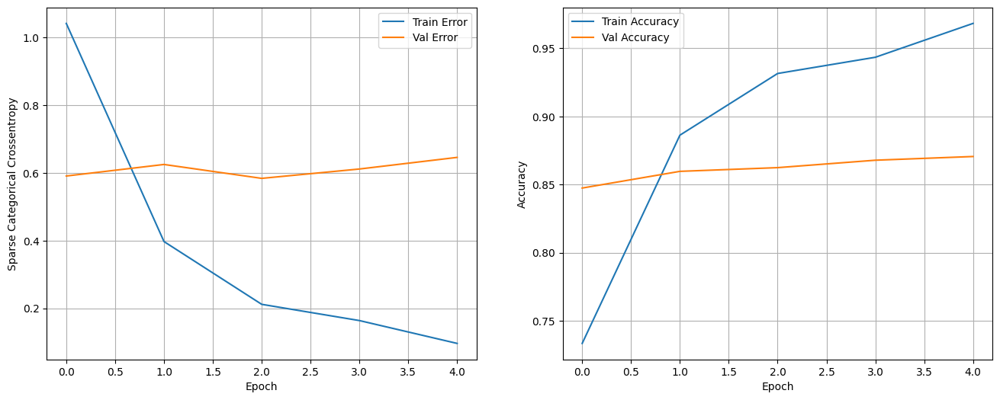

In [54]:
show_loss_accuracy_evolution(history)

In [ ]:
show_errors(val_ds, model_tl, class_names_list, n_images=10)

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model_tl, show_shapes=True)

In [55]:
# PODEMOS DIVIDIRLO EN 2 RAMAS:
# UNO EL MODELO Y LUEGO OTRO MODELO A PARTE PORQUE EL MOBILENET ESTABA DISEÑADO PARA APRENDER OTRO TIPO DE IMAGENES ENTONCES SE PIERDE INFORMACION QUE PODRÍAMOS GANA RPOR OTRA PARTE
# VAMOS A AÑADIR UNA CAPA DE CONVOLUCION Y EL MODELO PRE-ENTRENADO

inputs = tf.keras.Input(shape=image_size+(3, ), name='input')

#data_aug = data_augmentation(inputs)
reescaling = preprocess_input(inputs)

# Conv Layer 1
conv_1 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_1')(reescaling)
pool_1 = layers.MaxPooling2D(pool_size=(
    2, 2),  name='pool_1')(conv_1)
pool_1 = layers.Dropout(0.4)(pool_1)

# Conv Layer 2
conv_2 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_2')(pool_1)
pool_2 = layers.MaxPooling2D(name='pool_2')(conv_2)
pool_2 = layers.Dropout(0.4)(pool_2)

# Conv Layer 3
conv_3 = layers.Conv2D(16, 3, padding='valid',
                       activation='relu', name='conv_3')(pool_2)
pool_3 = layers.MaxPooling2D(name='pool_3')(conv_3)
pool_3 = layers.Dropout(0.4)(pool_3)

# Fully-connected
x1 = layers.Flatten(name='flatten')(pool_3)

x2 = pretrained_model(reescaling, training=False)
x2 = tf.keras.layers.Flatten()(x2)

x = tf.keras.layers.Concatenate()([x1, x2])
x = layers.Dropout(0.4)(x)
x = layers.Dense(64, activation='relu', name='dense')(x)
# A Dense classifier with a single unit (binary classification
outputs = tf.keras.layers.Dense(5, activation='softmax')(x)
model_tl = keras.Model(inputs, outputs)

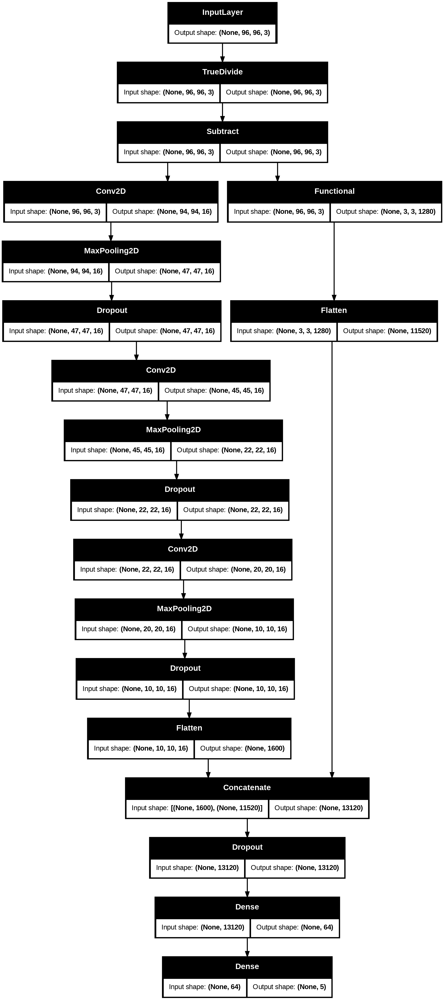

In [56]:
from tensorflow.keras.utils import plot_model
plot_model(model_tl, show_shapes=True)

# ENOTNCES VAMOS A PONER 2 PARTES, PRIMERO EL MOBILENET Y LUEGO UNA RED NORMAL Y LOS UNIMOS CON CONCATENATE

In [57]:
# PONEMOS 15 ÉPOCAS Y VEMOS QUE TIPO DE RESULTADOS TENEMOS
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)
epochs = 15
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

# VEMOS QUE CASI LLEGAMOS AL 90% DE ACCURACY USANDO UN MODELO PRE-ENTRENADO. LUEGO PODREMOS PROBAR EL RESTO QUE HAY. EN EXCEPTION HAY MUCHISIMOS.

Epoch 1/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 29s 340ms/step - accuracy: 0.5987 - loss: 1.2707 - val_accuracy: 0.8597 - val_loss: 0.4428
Epoch 2/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9112 - loss: 0.2480 - val_accuracy: 0.8597 - val_loss: 0.4916
Epoch 3/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 28ms/step - accuracy: 0.9595 - loss: 0.1214 - val_accuracy: 0.8624 - val_loss: 0.4790
Epoch 4/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.9856 - loss: 0.0630 - val_accuracy: 0.8597 - val_loss: 0.5249
Epoch 5/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.9864 - loss: 0.0459 - val_accuracy: 0.8747 - val_loss: 0.5417
Epoch 6/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9954 - loss: 0.0278 - val_accuracy: 0.8665 - val_loss: 0.5890
Epoch 7/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9932 - loss: 0.0251 - val_accuracy: 0.8706 - val_loss: 0.5813
Epoch 8/15
46/46 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9987 - loss: 0.0131 - val_accuracy: 0.8678 -

In [ ]:
show_errors(val_ds, model_tl, class_names_list, n_images=10) # PODEMOS ANALIZAR ADEMÁS LOS ERRORES QUE TIENEN LA RED

### Fine-tuning

EL FINE TUNNING ES LO MISMO PERO NO SE CONGELAN LOS PESOS, SE REENTRENAN. ESTO NORMALMENTE, A NO SER QUE TENGAMOS MUCHOS DATOS, VA A FUNCIONAR MUCHO PEOR Y VA A TARDAR MUCHO.

In [ ]:
epochs = 20
model_tl = tf.keras.Sequential([
    data_augmentation,
    layers.Rescaling(1./255),
    tf.keras.applications.MobileNetV2(input_shape=image_size+(3, ), include_top=False),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(5, activation='softmax')
])
model_tl.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=['accuracy']
)
history = model_tl.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

## Practice: Fashion MNIST Try to obtain  `Test Accuracy>0.89`!!

COMO PRÁCTICA S EPIDE CREAR UNA RED CONVOLUCIONAL SIN TRANSFER MINING PARA ESTE DATASET. QUE ES UN DATASET DE 10 CATEGORIAS DE 10 TIPOS DE ROPA QUE SE LLAMA MINST. A 70000 IMAGENES PREDECIR EL TIPO PARA PREDECIR EL TIPO DE PRENDA QUE ES CADA IMAGEN. PODEMOS USAR DATA ARGUMENTATIO O NO AUNQUE AUNQUE AQUI COMO SON IMAGENES DE POCA RESOLUCION ES POSIBLE QUE NO HAGA FALTA
ENTONCES SE QUIERE HACER UNA RED CONVOLUCIONAL CON 1 O 2 CAPAS QUE INTENTE LLEGAR AL 0.98 DE TEST ACCURACY. LA ULTIMA CAPA TENDRÁ QUE SER UNA SPFTMAX DE 10 NEURONAS.

Fashion MNIST dataset contains 70,000 grayscale images with 10 categories. The images show individual articles of clothing at low resolution (28 by 28 pixels).

<table>
  <tr><td>
    <img src="https://tensorflow.org/images/fashion-mnist-sprite.png"
         alt="Fashion MNIST sprite"  width="300">
  </td></tr>
  <tr><td align="center">
    <b>Figure 1.</b> <a href="https://github.com/zalandoresearch/fashion-mnist">Fashion-MNIST samples</a> (by Zalando, MIT License).<br/>&nbsp;
  </td></tr>
</table>

**Categories**:
<table>
  <tr>
    <th>Label</th>
    <th>Class</th>
  </tr>
  <tr>
    <td>0</td>
    <td>T-shirt/top</td>
  </tr>
  <tr>
    <td>1</td>
    <td>Trouser</td>
  </tr>
    <tr>
    <td>2</td>
    <td>Pullover</td>
  </tr>
    <tr>
    <td>3</td>
    <td>Dress</td>
  </tr>
    <tr>
    <td>4</td>
    <td>Coat</td>
  </tr>
    <tr>
    <td>5</td>
    <td>Sandal</td>
  </tr>
    <tr>
    <td>6</td>
    <td>Shirt</td>
  </tr>
    <tr>
    <td>7</td>
    <td>Sneaker</td>
  </tr>
    <tr>
    <td>8</td>
    <td>Bag</td>
  </tr>
    <tr>
    <td>9</td>
    <td>Ankle boot</td>
  </tr>
</table>

In [ ]:
# Load the dataset
fashion_mnist = tf.keras.datasets.fashion_mnist

(train_images, train_labels), (test_images,
                               test_labels) = fashion_mnist.load_data()

print('train_images shape: {0}, test_images shape: {1}'.format(
    train_images.shape, test_images.shape))

In [ ]:
class_names = [
    'T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt',
    'Sneaker', 'Bag', 'Ankle boot'
]

In [ ]:
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap='gray')
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip(),
    layers.experimental.preprocessing.RandomRotation(0.25),
  ]
)

data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip(),
  ]
)

In [ ]:
inputs = tf.keras.Input(shape=(28, 28, 1), name='input')
#aug = data_augmentation(inputs)
reescaling = layers.Rescaling(1. / 255)(inputs)
...
model = keras.Model(inputs=inputs, outputs=outputs, name='cnn_mnist')

In [ ]:
### compile the model
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

In [ ]:
### train
model.fit(train_images, train_labels,
          epochs=7, batch_size=32, validation_split=0.2)

In [ ]:
results = model.evaluate(test_images, test_labels, verbose=1)
print('Test Loss: {}'.format(results[0]))
print('Test Accuracy: {}'.format(results[1]))

### Plotting predictions

In [ ]:
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, -1)
predictions.shape, predicted_classes.shape
predictions[i,:]

In [ ]:
L = 5
W = 5
fig, axes = plt.subplots(L, W, figsize=(18, 18))
axes = axes.ravel()

for i in np.arange(0, L * W):
    axes[i].imshow(test_images[i].reshape(28, 28))
    prob_pred = np.max(predictions[i, :])
    class_pred = class_names[int(predicted_classes[i])]
    original_class = class_names[int(test_labels[i])]
    if class_pred == original_class:
        color = 'green'
    else:
        color = 'red'
    title = "Pred: {0} \n Target: {1} \n Prob: {2:.3f}".format(
    class_pred, original_class, prob_pred)
    axes[i].set_title(title, color=color)
    axes[i].axis('off')

plt.subplots_adjust(wspace=0.5)